In [ ]:
!pip install kaggle

In [ ]:
!mkdir ~/.kaggle
!echo '{"username":"hasyari","key":"e1422bce8a64ba259cff4d0096dc15f0"}' > ~/.kaggle/kaggle.json
!chmod 600 ~/.kaggle/kaggle.json

In [ ]:
!kaggle datasets download -d ayuraj/asl-dataset -p /tmp

 86% 49.0M/56.9M [00:00<00:00, 73.9MB/s]
100% 56.9M/56.9M [00:00<00:00, 81.5MB/s]


In [ ]:
import zipfile

zip_asl = '/tmp/asl-dataset.zip'

zip_ext = zipfile.ZipFile(zip_asl, 'r')
zip_ext.extractall('/content/')

In [ ]:
!pip install split-folders

In [ ]:
import os
import cv2
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from keras.preprocessing.image import ImageDataGenerator
import keras
from keras.callbacks import EarlyStopping,ModelCheckpoint
import tensorflow as tf
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from tqdm import tqdm

In [ ]:
base_folder = 'asl_dataset/asl_dataset/'

# List comprehension to get all image paths and labels
images = [os.path.join(base_folder, subfolder, image_filename)
          for subfolder in tqdm(os.listdir(base_folder))
          if os.path.isdir(os.path.join(base_folder, subfolder)) and subfolder != 'asl_dataset'
          for image_filename in os.listdir(os.path.join(base_folder, subfolder))]

labels = [subfolder
          for subfolder in os.listdir(base_folder)
          if os.path.isdir(os.path.join(base_folder, subfolder)) and subfolder != 'asl_dataset'
          for _ in os.listdir(os.path.join(base_folder, subfolder))]

# Create a DataFrame
df = pd.DataFrame({'image': images, 'label': labels})

100%|██████████| 36/36 [00:00<00:00, 5576.91it/s]


# Visualization of Dataset



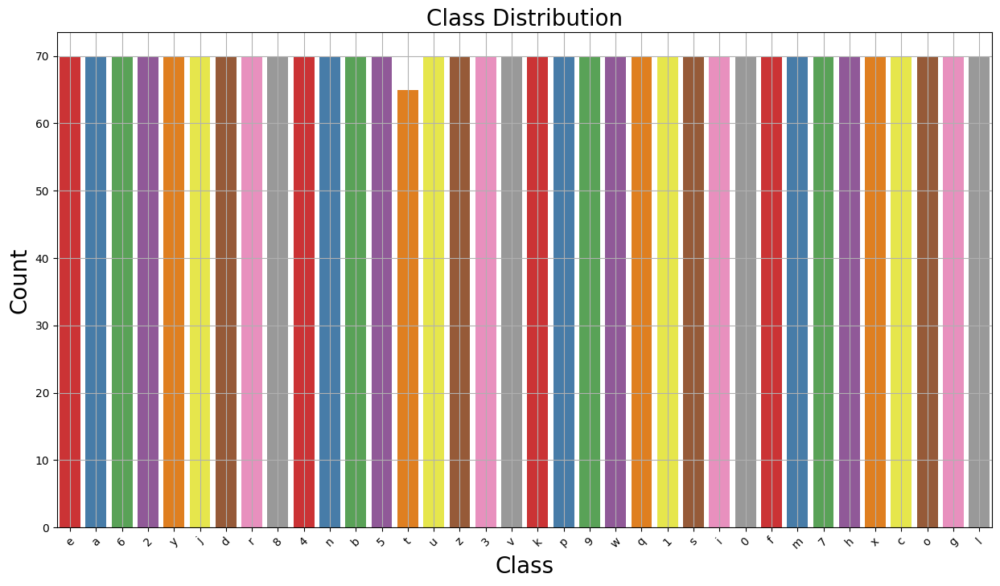

In [ ]:
def plot_class_distribution(dataframe, xlabel='Class', ylabel='Count', title='Class Distribution', figsize=(15, 8), rotation=45):
    plt.figure(figsize=figsize)
    ax = sns.countplot(x=dataframe['label'], palette='Set1')
    ax.set_xlabel(xlabel, fontsize=20)
    ax.set_ylabel(ylabel, fontsize=20)
    plt.title(title, fontsize=20)
    plt.grid(True)
    plt.xticks(rotation=rotation)
    plt.show()

# Assuming 'df' is your DataFrame
plot_class_distribution(df)

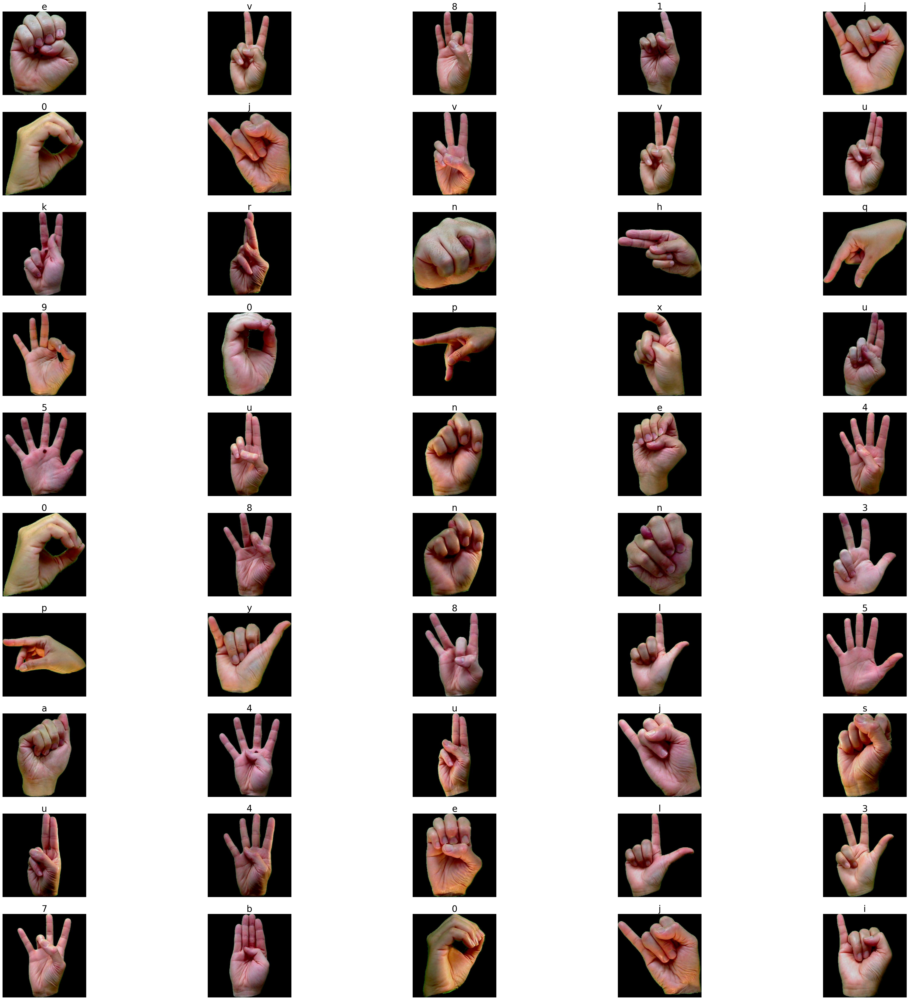

In [ ]:
def display_random_images(dataframe, num_images=50, image_size=(224, 224), figsize=(50, 50), rows=10, cols=5):
    plt.figure(figsize=figsize)
    for n, i in enumerate(np.random.randint(0, len(dataframe), num_images)):
        plt.subplot(rows, cols, n + 1)
        img = cv2.imread(dataframe.image[i])
        img = cv2.resize(img, image_size)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        plt.imshow(img)
        plt.axis('off')
        plt.title(dataframe.label[i], fontsize=25)
    plt.show()

display_random_images(df)

# Data Augmentation

In [ ]:
# Split the dataset into training and test1 sets
X_train, X_test1, y_train, y_test1 = train_test_split(df['image'], df['label'], test_size=0.3, random_state=42, shuffle=True, stratify=df['label'])

# Further split the test1 set into validation and test sets
X_val, X_test, y_val, y_test = train_test_split(X_test1, y_test1, test_size=0.5, random_state=42, shuffle=True, stratify=y_test1)

# Create DataFrames for the training, validation, and test sets
df_train = pd.DataFrame({'image': X_train, 'label': y_train})
df_test = pd.DataFrame({'image': X_test, 'label': y_test})
df_val = pd.DataFrame({'image': X_val, 'label': y_val})

In [ ]:
def create_image_data_generator(dataframe, image_size=(224, 224), batch_size=32, shuffle=True):
    datagen = ImageDataGenerator(
        rescale=1./255,
        rotation_range=20,
        zoom_range=0.2,
        horizontal_flip=True,
        fill_mode='nearest'
    )

    generator = datagen.flow_from_dataframe(
        dataframe,
        x_col='image',
        y_col='label',
        target_size=image_size,
        batch_size=batch_size,
        class_mode='categorical',
        shuffle=shuffle
    )

    return generator

image_size = (224, 224)
batch_size = 32

train_generator = create_image_data_generator(df_train, image_size=image_size, batch_size=batch_size, shuffle=True)
test_generator = create_image_data_generator(df_test, image_size=image_size, batch_size=batch_size, shuffle=False)
val_generator = create_image_data_generator(df_val, image_size=image_size, batch_size=batch_size, shuffle=True)


Found 1760 validated image filenames belonging to 36 classes.
Found 378 validated image filenames belonging to 36 classes.
Found 377 validated image filenames belonging to 36 classes.


# Modeling

In [ ]:
# Define the CNN model
model = keras.Sequential([
    keras.layers.Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3)),
    keras.layers.MaxPooling2D((2, 2)),

    keras.layers.Conv2D(64, (3, 3), activation='relu'),
    keras.layers.MaxPooling2D((2, 2)),

    keras.layers.Flatten(),
    keras.layers.Dense(256, activation='relu'),
    keras.layers.Dropout(0.3),
    keras.layers.Dense(36, activation='softmax')
])

# Display the model summary
model.summary()


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2  (None, 111, 111, 32)      0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 109, 109, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 54, 54, 64)        0         
 g2D)                                                            
                                                                 
 flatten (Flatten)           (None, 186624)            0         
                                                                 
 dense (Dense)               (None, 256)               4

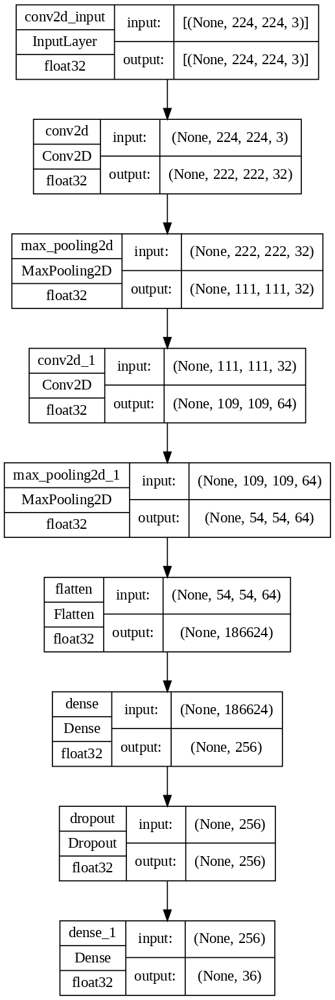

In [ ]:
tf.keras.utils.plot_model(model, to_file='model.png', show_shapes=True, show_layer_names=True,show_dtype=True,dpi=120)

In [ ]:
# Define callbacks
checkpoint_cb = ModelCheckpoint("ASL_model.h5", save_best_only=True)
early_stopping_cb = EarlyStopping(patience=5, restore_best_weights=True)

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Assuming you have 'train_generator' and 'val_generator' defined
hist = model.fit(train_generator, epochs=20, validation_data=val_generator, callbacks=[checkpoint_cb, early_stopping_cb])

Epoch 1/20
55/55 [==============================] - ETA: 0s - loss: 3.3018 - accuracy: 0.1460

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


55/55 [==============================] - 41s 632ms/step - loss: 3.3018 - accuracy: 0.1460 - val_loss: 2.1646 - val_accuracy: 0.3448
Epoch 2/20
55/55 [==============================] - 36s 660ms/step - loss: 1.8995 - accuracy: 0.4273 - val_loss: 1.2923 - val_accuracy: 0.5782
Epoch 3/20
55/55 [==============================] - 33s 598ms/step - loss: 1.3405 - accuracy: 0.5778 - val_loss: 1.0251 - val_accuracy: 0.6764
Epoch 4/20
55/55 [==============================] - 33s 596ms/step - loss: 1.0927 - accuracy: 0.6449 - val_loss: 0.7798 - val_accuracy: 0.7135
Epoch 5/20
55/55 [==============================] - 33s 597ms/step - loss: 0.9864 - accuracy: 0.6614 - val_loss: 0.6745 - val_accuracy: 0.7586
Epoch 6/20
55/55 [==============================] - 33s 595ms/step - loss: 0.8813 - accuracy: 0.7000 - val_loss: 0.6299 - val_accuracy: 0.7719
Epoch 7/20
55/55 [==============================] - 39s 722ms/step - loss: 0.7312 - accuracy: 0.7375 - val_loss: 0.5915 - val_accuracy: 0.7878
Epoch 8/20

# Evaluate The Model



In [ ]:
hist_=pd.DataFrame(hist.history)
hist_

,loss,accuracy,val_loss,val_accuracy
0,3.301838,0.146023,2.164645,0.344828
1,1.899470,0.427273,1.292258,0.578249
2,1.340523,0.577841,1.025122,0.676393
3,1.092706,0.644886,0.779800,0.713528
4,0.986383,0.661364,0.674476,0.758621
5,0.881287,0.700000,0.629945,0.771883
6,0.731240,0.737500,0.591521,0.787798
7,0.648217,0.778977,0.543254,0.801061
8,0.620024,0.792614,0.412002,0.862069
9,0.547599,0.807386,0.426427,0.851459


from matplotlib import pyplot as plt
hist_['loss'].plot(kind='hist', bins=20, title='loss')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
hist_['accuracy'].plot(kind='hist', bins=20, title='accuracy')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
hist_['val_loss'].plot(kind='hist', bins=20, title='val_loss')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
hist_['val_accuracy'].plot(kind='hist', bins=20, title='val_accuracy')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
hist_.plot(kind='scatter', x='loss', y='accuracy', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
hist_.plot(kind='scatter', x='accuracy', y='val_loss', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
hist_.plot(kind='scatter', x='val_loss', y='val_accuracy', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
hist_['loss'].plot(kind='line', figsize=(8, 4), title='loss')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
hist_['accuracy'].plot(kind='line', figsize=(8, 4), title='accuracy')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
hist_['val_loss'].plot(kind='line', figsize=(8, 4), title='val_loss')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
hist_['val_accuracy'].plot(kind='line', figsize=(8, 4), title='val_accuracy')
plt.gca().spines[['top', 'right']].set_visible(False)

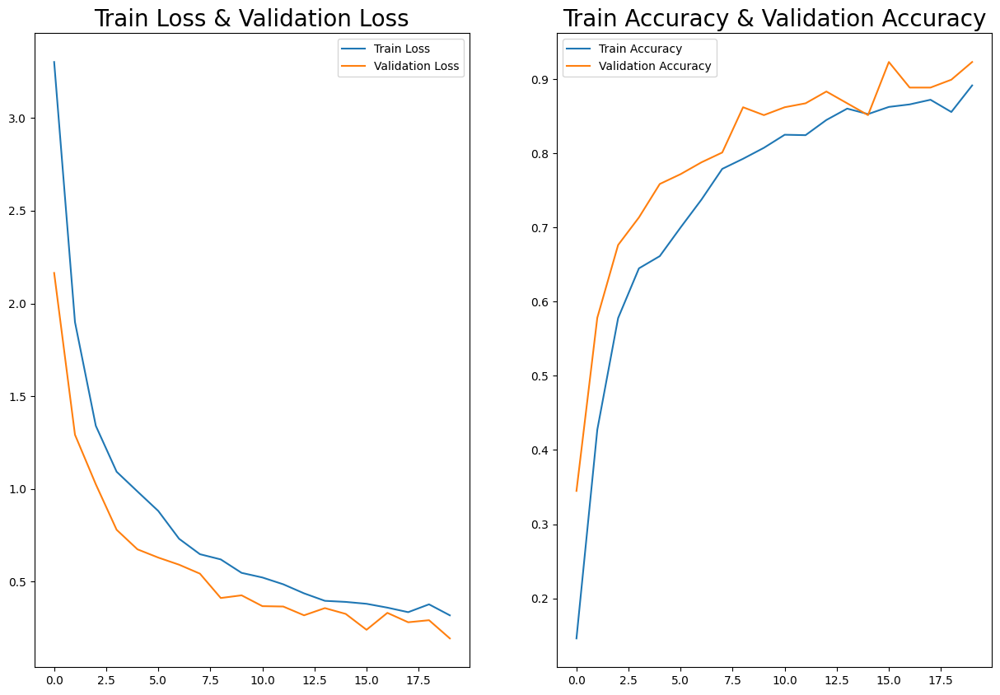

In [ ]:
def plot_training_history(history):
    plt.figure(figsize=(15, 10))

    # Plot training and validation loss
    plt.subplot(1, 2, 1)
    plt.plot(history['loss'], label='Train Loss')
    plt.plot(history['val_loss'], label='Validation Loss')
    plt.title('Train Loss & Validation Loss', fontsize=20)
    plt.legend()

    # Plot training and validation accuracy
    plt.subplot(1, 2, 2)
    plt.plot(history['accuracy'], label='Train Accuracy')
    plt.plot(history['val_accuracy'], label='Validation Accuracy')
    plt.title('Train Accuracy & Validation Accuracy', fontsize=20)
    plt.legend()

    plt.show()

plot_training_history(hist_)

In [ ]:
score, acc= model.evaluate(test_generator)
print('Test Loss =', score)
print('Test Accuracy =', acc)

12/12 [==============================] - 6s 459ms/step - loss: 0.3812 - accuracy: 0.8519
Test Loss = 0.38118836283683777
Test Accuracy = 0.8518518805503845


In [ ]:
# Get actual labels
y_test = test_generator.classes

# Make predictions
predictions = model.predict(test_generator)

# Get predicted labels
y_pred = np.argmax(predictions, axis=1)

# Flatten arrays if needed
y_test = np.ravel(y_test)
y_pred = np.ravel(y_pred)

# Create DataFrame for comparison
df_comparison = pd.DataFrame({'Actual': y_test, 'Prediction': y_pred})

12/12 [==============================] - 6s 464ms/step


In [ ]:
dict_=train_generator.class_indices
def get_Name(N):
    for x,y in dict_.items():
        if y==N:
            return x
get_Name(10)

'a'

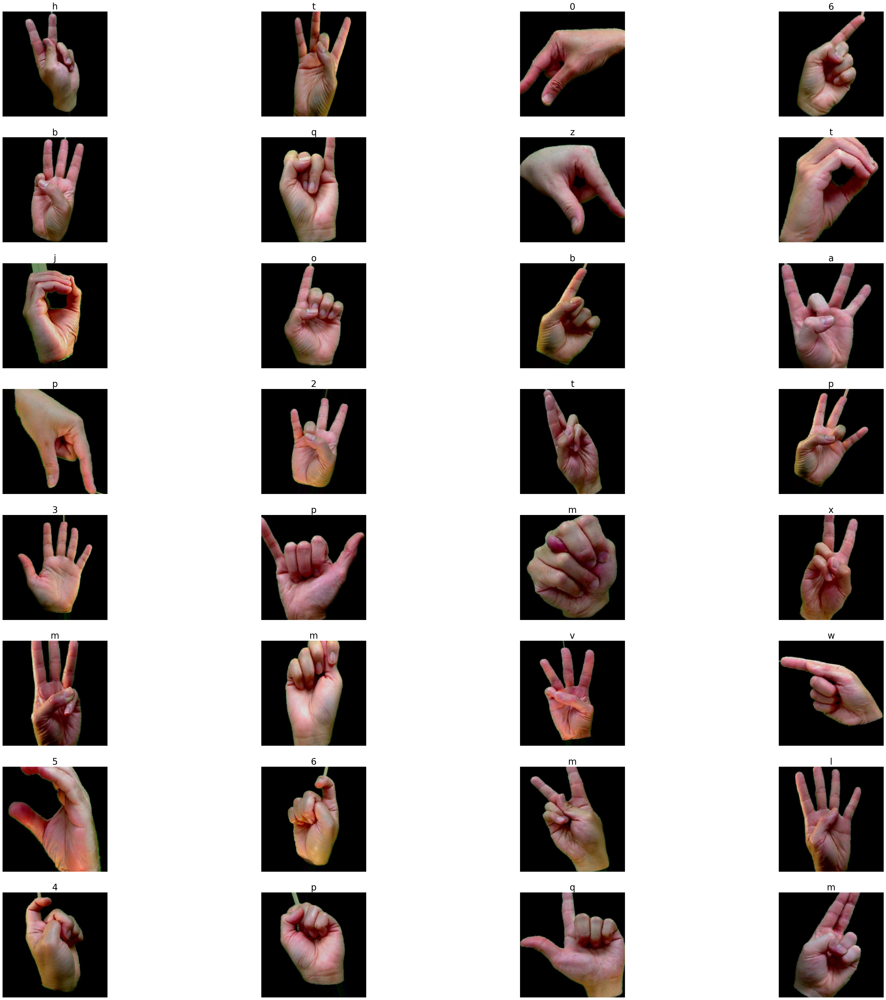

In [ ]:
batch = next(test_generator)
images= batch[0]
plt.figure(figsize=(50,50))
for n in range(32):
    plt.subplot(8,4,n+1)
    plt.imshow(images[n])
    plt.axis('off')
    plt.title(get_Name(int(y_test[n])),fontsize=25)

In [ ]:
ClassificationReport = classification_report(y_test,y_pred)
print('Classification Report is : ', ClassificationReport )

Classification Report is :                precision    recall  f1-score   support

           0       0.71      0.50      0.59        10
           1       1.00      1.00      1.00        11
           2       1.00      0.91      0.95        11
           3       0.92      1.00      0.96        11
           4       1.00      0.80      0.89        10
           5       0.91      1.00      0.95        10
           6       0.53      0.73      0.62        11
           7       0.91      0.91      0.91        11
           8       0.90      0.90      0.90        10
           9       1.00      1.00      1.00        10
          10       0.89      0.73      0.80        11
          11       1.00      1.00      1.00        11
          12       0.91      1.00      0.95        10
          13       1.00      1.00      1.00        10
          14       1.00      0.73      0.84        11
          15       1.00      0.90      0.95        10
          16       0.89      0.80      0.84        10

array([[ 5,  0,  0, ...,  0,  0,  0],
       [ 0, 11,  0, ...,  0,  0,  0],
       [ 0,  0, 10, ...,  0,  0,  0],
       ...,
       [ 0,  0,  0, ..., 11,  0,  0],
       [ 0,  0,  0, ...,  0,  9,  0],
       [ 0,  0,  0, ...,  0,  0, 11]])

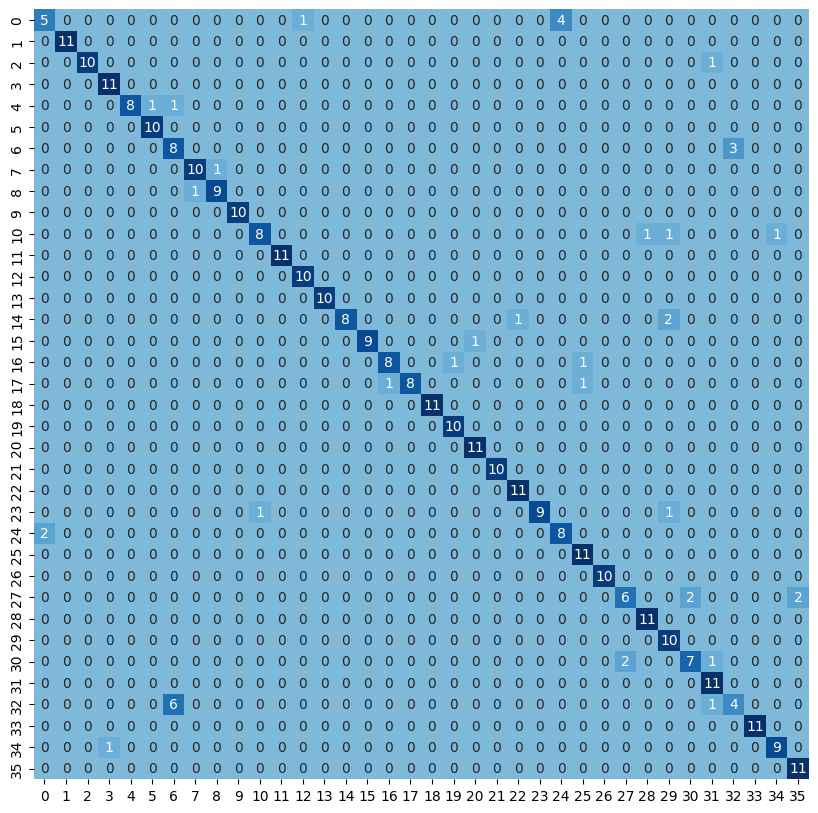

In [ ]:
plt.figure(figsize=(10,10))
CM = confusion_matrix(y_test,y_pred)
sns.heatmap(CM,fmt='g',center = True,cbar=False,annot=True,cmap='Blues')
CM

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import tensorflow as tf
model.save('/content/drive/MyDrive/Capstone/model_capstone/model_2.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
import string

# Generating a mixed list with numbers (0 to 10) and lowercase letters (a to z)
mixed_list = list(range(11)) + list(string.ascii_lowercase)

# Printing the mixed list
print(mixed_list)

# Creating a list with the same elements using string.digits and string.ascii_lowercase
alphabet = list(string.digits) + list(string.ascii_lowercase)

# Printing the length of the alphabet list
print(len(alphabet))

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 'a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'i', 'j', 'k', 'l', 'm', 'n', 'o', 'p', 'q', 'r', 's', 't', 'u', 'v', 'w', 'x', 'y', 'z']
36
